# E9 241 Digital Image Processing - Assignment 4
***
*Submitted by: Dwaipayan Haldar*<br>
*S.R. No. : 27128*

In [2]:
import numpy as np
import skimage

import matplotlib.pyplot as plt
from skimage.transform import rescale
from skimage.util import img_as_float


from src.P01_Image_Downsampling import *
from src.P02_Edge_Detection import *

## Problem 1: Image Downsampling

### Problem 1.(a)

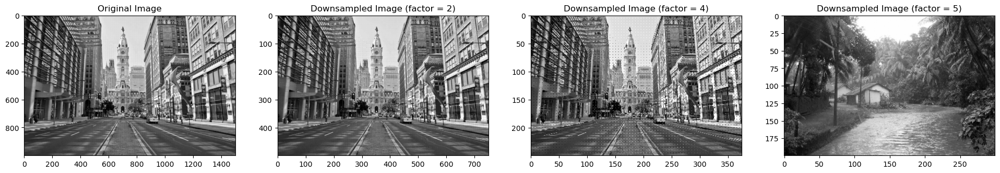

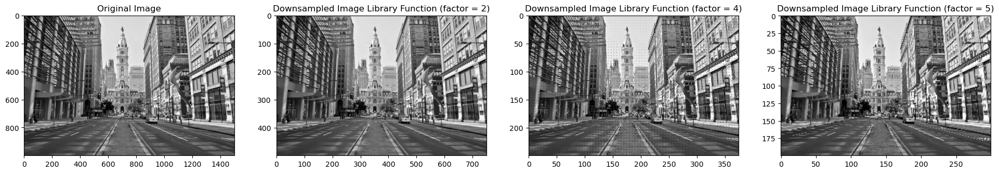

In [6]:
city_img = img_as_float(skimage.io.imread('images/city.png'))

city_img_downsampled_2 = downsample(city_img, 2)
city_img_downsampled_4 = downsample(city_img, 4)
city_img_downsampled_5 = downsample(city_img, 5)

city_img_downsampled_lf_2 = rescale(city_img, 1/2, anti_aliasing = False, channel_axis = None)
city_img_downsampled_lf_4 = rescale(city_img, 1/4, anti_aliasing = False, channel_axis = None)
city_img_downsampled_lf_5 = rescale(city_img, 1/5, anti_aliasing = False, channel_axis = None)

plt.figure(figsize=(24,16))
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(city_img, cmap = 'gray')
plt.subplot(1,4,2)
plt.title("Downsampled Image (factor = 2)")
plt.imshow(city_img_downsampled_2, cmap = 'gray')
plt.subplot(1,4,3)
plt.title("Downsampled Image (factor = 4)")
plt.imshow(city_img_downsampled_4, cmap = 'gray')
plt.subplot(1,4,4)
plt.title("Downsampled Image (factor = 5)")
plt.imshow(city_img_downsampled_5, cmap = 'gray')
plt.show()

plt.figure(figsize=(24,16))
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(city_img, cmap = 'gray')
plt.subplot(1,4,2)
plt.title("Downsampled Image Library Function (factor = 2)")
plt.imshow(city_img_downsampled_lf_2, cmap = 'gray')
plt.subplot(1,4,3)
plt.title("Downsampled Image Library Function (factor = 4)")
plt.imshow(city_img_downsampled_lf_4, cmap = 'gray')
plt.subplot(1,4,4)
plt.title("Downsampled Image Library Function (factor = 5)")
plt.imshow(city_img_downsampled_lf_5, cmap = 'gray')
plt.show()          
                                                                                                                    

### Problem 1.(b)

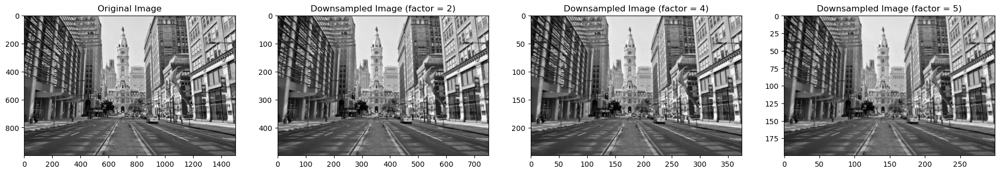

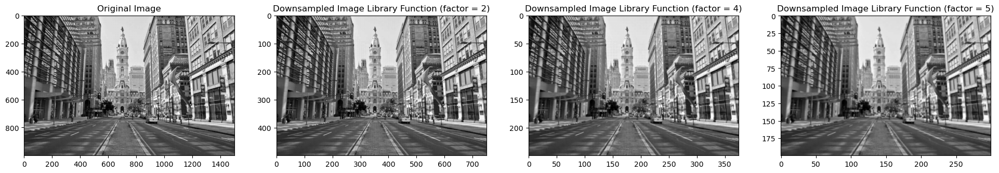

MSE of the Downsampled Image(N=2): 0.0005187508202385213
MSE of the Downsampled Image(N=4): 0.0009266532513831333
MSE of the Downsampled Image(N=5): 0.0013359019228505712


In [11]:
city_img_lpf_downsample_2 = aa_downsample(city_img, 5, 2, 2)
city_img_lpf_downsample_4 = aa_downsample(city_img, 5, 2, 4)
city_img_lpf_downsample_5 = aa_downsample(city_img, 5, 2, 5)

city_img_lpf_downsample_lf_2 = rescale(city_img, 1/2, anti_aliasing= True, channel_axis= None)
city_img_lpf_downsample_lf_4 = rescale(city_img, 1/4, anti_aliasing= True, channel_axis= None)
city_img_lpf_downsample_lf_5 = rescale(city_img, 1/5, anti_aliasing= True, channel_axis= None)


plt.figure(figsize=(24,16))
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(city_img, cmap = 'gray')
plt.subplot(1,4,2)
plt.title("Downsampled Image (factor = 2)")
plt.imshow(city_img_lpf_downsample_2, cmap = 'gray')
plt.subplot(1,4,3)
plt.title("Downsampled Image (factor = 4)")
plt.imshow(city_img_lpf_downsample_4, cmap = 'gray')
plt.subplot(1,4,4)
plt.title("Downsampled Image (factor = 5)")
plt.imshow(city_img_lpf_downsample_5, cmap = 'gray')
plt.show()

plt.figure(figsize=(24,16))
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(city_img, cmap = 'gray')
plt.subplot(1,4,2)
plt.title("Downsampled Image Library Function (factor = 2)")
plt.imshow(city_img_lpf_downsample_lf_2, cmap = 'gray')
plt.subplot(1,4,3)
plt.title("Downsampled Image Library Function (factor = 4)")
plt.imshow(city_img_lpf_downsample_lf_4, cmap = 'gray')
plt.subplot(1,4,4)
plt.title("Downsampled Image Library Function (factor = 5)")
plt.imshow(city_img_lpf_downsample_lf_5, cmap = 'gray')
plt.show()

print("MSE of the Downsampled Image(N=2):", mse(city_img_lpf_downsample_2, city_img_lpf_downsample_lf_2))
print("MSE of the Downsampled Image(N=4):", mse(city_img_lpf_downsample_4, city_img_lpf_downsample_lf_4))
print("MSE of the Downsampled Image(N=5):", mse(city_img_lpf_downsample_5, city_img_lpf_downsample_lf_5))

### Problem 1.(c)

In [12]:
mse(rescale(city_img, 1/5, anti_aliasing=True, channel_axis= None), aa_downsample(city_img, 13, 3.05, 5))

0.0008854407021445231

In [ ]:
filter_size = [3,5,7,9,11,13,15,17,19]
sigma = np.linspace(0.05, 4, 80)
city_img_library_downsample = rescale(city_img, 1/5, anti_aliasing=True, channel_axis= None)
mse_calculated = np.inf
filter_size_optimal = 0
sigma_optimal = 0

for filter_size in filter_size:
    for sigma in np.linspace(0.05, 4, 80):
        city_img_custom_downsample = aa_downsample(city_img, filter_size, sigma, 5)
        k = mse(city_img_library_downsample, city_img_custom_downsample)
        if  k  < mse_calculated:
            mse_calculated = k 
            filter_size_optimal = filter_size
            sigma_optimal = sigma

print("Optimal Sigma:", sigma_optimal)
print("Optimal Filter Size:", filter_size_optimal)

Optimal Sigma: 3.05
Optimal Filter Size: 13


## Problem 2: Edge Detection

### Problem 2.(a)

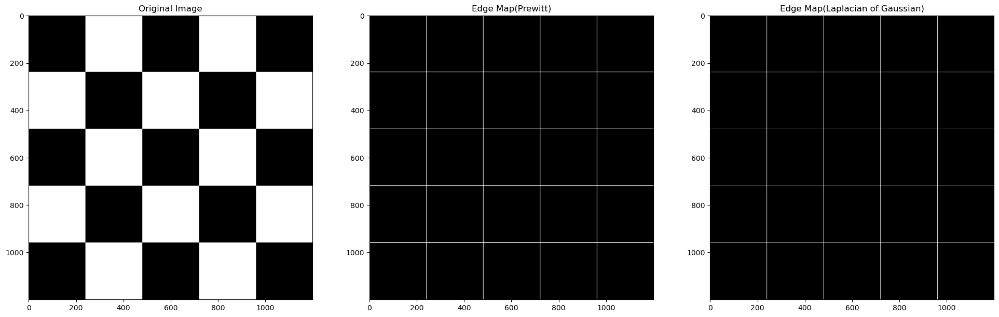

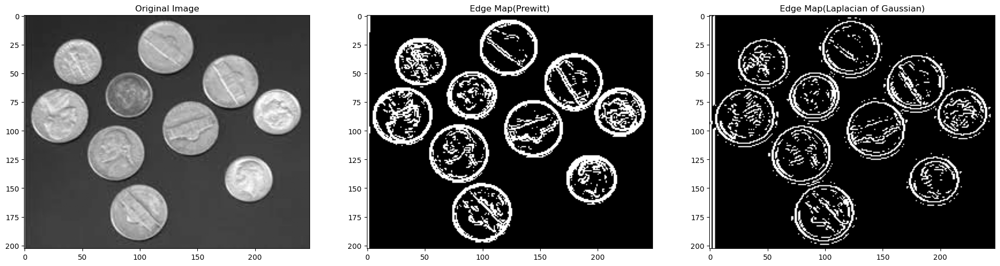

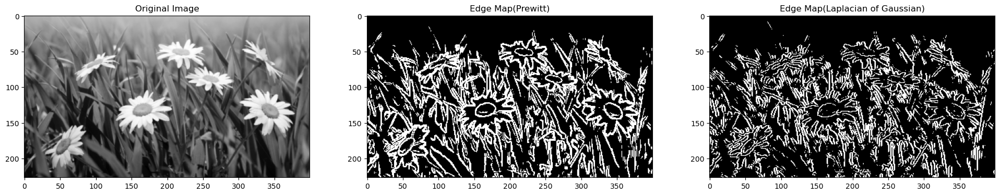

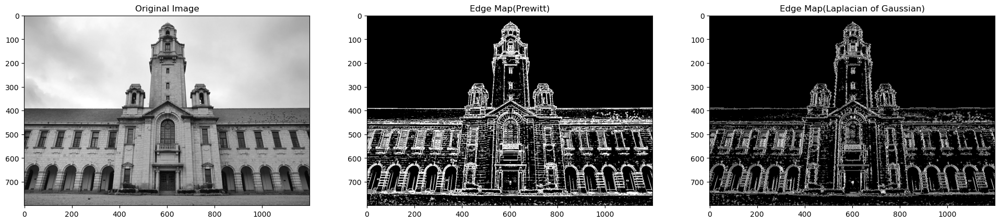

In [3]:
checkerboard_img = img_as_float(skimage.io.imread('images/Checkerboard.png'))
coins_img = img_as_float(skimage.io.imread('images/coins.png'))
flowers_img = img_as_float(skimage.io.imread('images/flowers.png'))
mainbuilding_img = img_as_float(skimage.io.imread('images/MainBuilding.png'))

checkerboard_img_prewitt = prewitt(checkerboard_img)
checkerboard_img_log = laplacian_of_gaussian(checkerboard_img, 7,1.5)

coins_img_prewitt = prewitt(coins_img)
coins_img_log = laplacian_of_gaussian(coins_img, 7,1.5)

flowers_img_prewitt = prewitt(flowers_img)
flowers_img_log = laplacian_of_gaussian(flowers_img, 7,1.5)

mainbuilding_img_prewitt = prewitt(mainbuilding_img)
mainbuilding_img_log = laplacian_of_gaussian(mainbuilding_img, 7,1.5)

plot_figure(checkerboard_img, checkerboard_img_prewitt, checkerboard_img_log)
plot_figure(coins_img, coins_img_prewitt, coins_img_log)
plot_figure(flowers_img, flowers_img_prewitt, flowers_img_log)
plot_figure(mainbuilding_img, mainbuilding_img_prewitt, mainbuilding_img_log)

### Problem 2.(b)

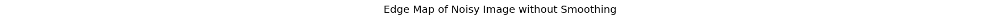

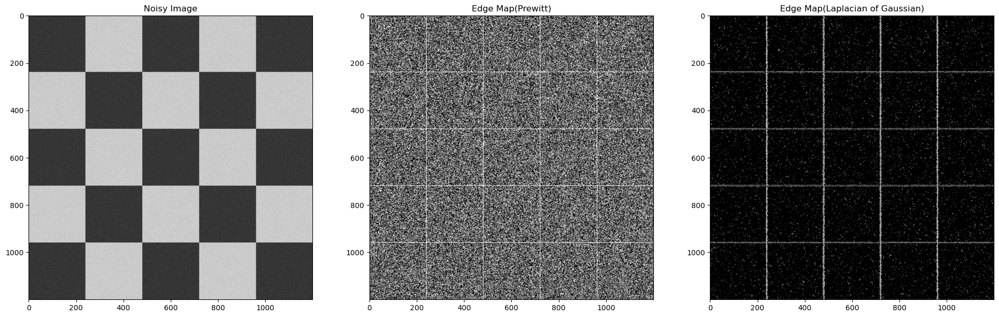

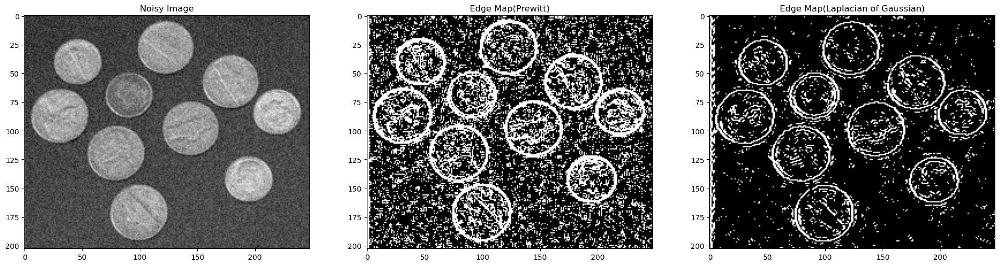

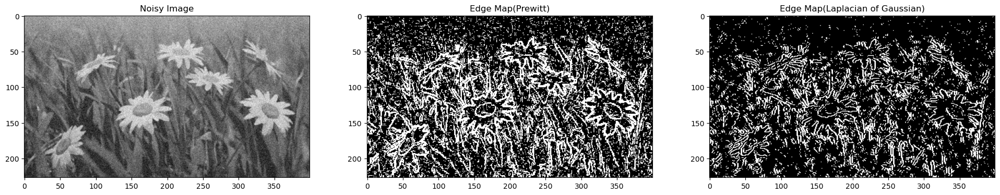

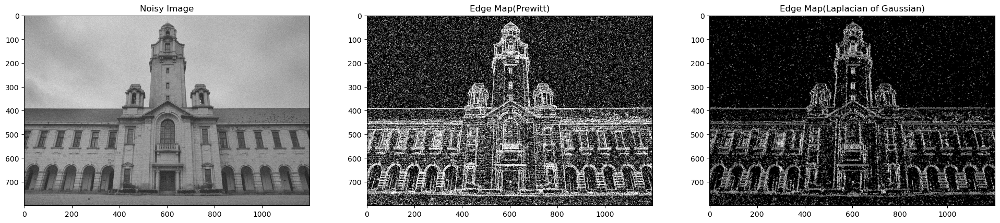

In [4]:
checkerboard_img_noise = add_gaussian_noise(checkerboard_img, 0.075)
coins_img_noise = add_gaussian_noise(coins_img,0.075)
flowers_img_noise = add_gaussian_noise(flowers_img,0.075)
mainbuilding_img_noise = add_gaussian_noise(mainbuilding_img,0.075)

plt.figure(figsize=(24,0.25))
plt.text(0.5, 0.5, "Edge Map of Noisy Image without Smoothing",fontsize=14, ha='center', va='center')
plt.axis('off')
plt.show()
plot_figure(checkerboard_img_noise, prewitt(checkerboard_img_noise), laplacian_of_gaussian(checkerboard_img_noise, 7, 1.5,0.35), "Noisy Image")
plot_figure(coins_img_noise, prewitt(coins_img_noise), laplacian_of_gaussian(coins_img_noise, 7,1.5,0.35), "Noisy Image")
plot_figure(flowers_img_noise, prewitt(flowers_img_noise), laplacian_of_gaussian(flowers_img_noise, 7,1.5,0.35), "Noisy Image")
plot_figure(mainbuilding_img_noise, prewitt(mainbuilding_img_noise), laplacian_of_gaussian(mainbuilding_img_noise, 7,1.5,0.35), "Noisy Image")

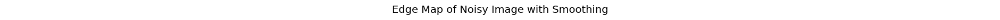

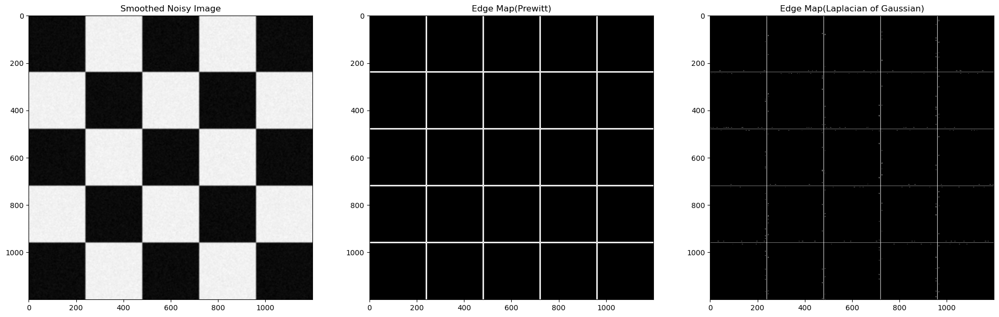

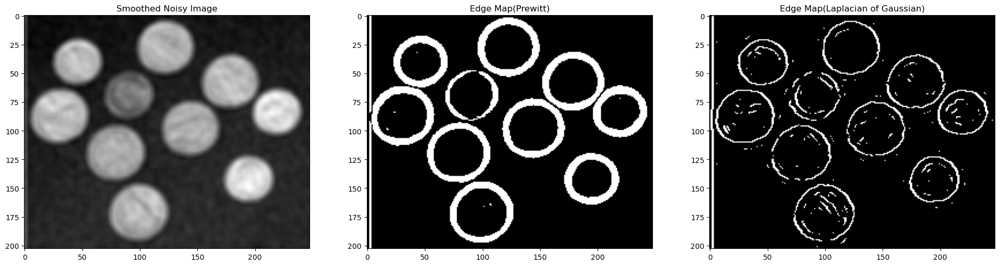

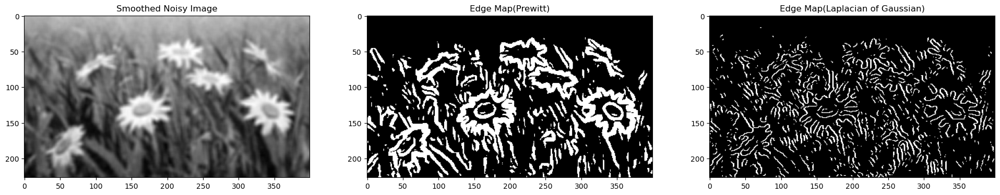

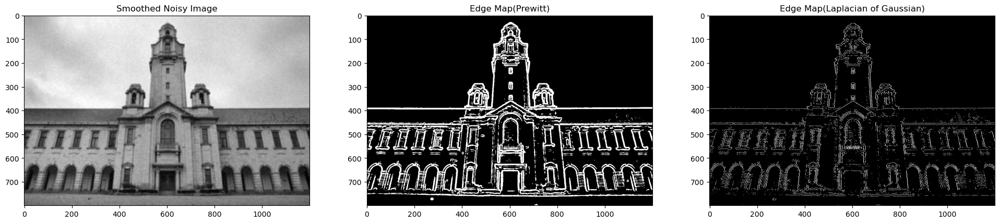

In [5]:
checkerboard_img_noise_smooth = gaussian_smoothing(checkerboard_img_noise)
coins_img_noise_smooth = gaussian_smoothing(coins_img_noise)
flowers_img_noise_smooth = gaussian_smoothing(flowers_img_noise)
mainbuilding_img_noise_smooth = gaussian_smoothing(mainbuilding_img_noise)

plt.figure(figsize=(24,0.25))
plt.text(0.5, 0.5, "Edge Map of Noisy Image with Smoothing",fontsize=14, ha='center', va='center')
plt.axis('off')
plt.show()
plot_figure(checkerboard_img_noise_smooth, prewitt(checkerboard_img_noise_smooth), laplacian_of_gaussian(checkerboard_img_noise_smooth, 19,1.5, 0.1), "Smoothed Noisy Image")
plot_figure(coins_img_noise_smooth, prewitt(coins_img_noise_smooth), laplacian_of_gaussian(coins_img_noise_smooth, 19,1.5,0.1), "Smoothed Noisy Image")
plot_figure(flowers_img_noise_smooth, prewitt(flowers_img_noise_smooth), laplacian_of_gaussian(flowers_img_noise_smooth, 19,1.5,0.1), "Smoothed Noisy Image")
plot_figure(mainbuilding_img_noise_smooth, prewitt(mainbuilding_img_noise_smooth), laplacian_of_gaussian(mainbuilding_img_noise_smooth, 19,1.5,0.1), "Smoothed Noisy Image")